In [3]:
import gensim
from gensim.models import word2vec
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from gensim import corpora
from gensim import models
from bs4 import BeautifulSoup
import logging
import numpy as np

In [29]:
data = pd.read_csv('reviewComment.csv', delimiter=',')
data

,id,user_login,body,path,commit_id,in_reply_to_id,repo_full_name
0,121,agramfort,spaces after commas thanks :)\n,scikits/learn/svm/src/liblinear/_liblinear.pyx,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
1,122,agramfort,are you sure about cfort? is does not appear e...,scikits/learn/svm/src/liblinear/liblinear_help...,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
2,1161,elupus,Any reason this check is removed? Should we no...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
3,1252,jmarshallnz,Yup - look up for internal_version (this inli...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
4,1551,agramfort,does or does not?\n,doc/developers/neighbors.rst,25ef0935eea6de67c1574b61510c6715953733a1,0,NaN
...,...,...,...,...,...,...,...
99995,18391536,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99996,18391553,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99997,18391566,jamtur01,invoke\n,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99998,18391634,jamtur01,or `localhost`.\n,docs/sources/examples/running_ssh_service.md,1cc35466f288384fb5c0c8a75d45a8d56e840d27,0,NaN


In [30]:
def cleanReview(subject):
    # 预处理
    beau = BeautifulSoup(subject)
    newSubject = beau.get_text()
    newSubject = newSubject.replace('>','').replace("->"," ").replace('`',' ')
    newSubject = newSubject.replace("..."," ").replace("```"," ")
    newSubject = newSubject.replace("\\", "").replace("\'","").replace('/', '').replace('"', '').replace(',', ' ').replace('.', ' ').replace('?', ' ').replace('!',' ').replace('(', ' ').replace(')', ' ').replace(':',' ').replace('\n',' ').replace('\r',' ')
    newSubject = newSubject.strip().split(" ")
    newSubject = [word.lower() for word in newSubject]
    # join() 方法用于将序列中的元素以指定的字符连接生成一个新的字符串
    newSubject = " ".join(newSubject)
    
    return newSubject

In [31]:
data["body"] = data["body"].apply(cleanReview)
data

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://en.wikipedia.org/wiki/Boolean
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://checkstyle.sourceforge.net/config_modifier.html
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://www.assembla.com/spaces/akka/tickets/1360-actorpath--add-rootpath-accessor-and-remove-string%28%29
" looks like a URL. Beautiful Soup is not an

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://cl.ly/1P37021y1w1V0y0o0v2m
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://www.assembla.com/spaces/akka/tickets/2228-handle-props-apply%5Bnothing%5D-as-props-empty
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://blogs.technet.com/b/grouppolicy/archive/2009/04/22/passwords-in-group-policy-preferences-updated.aspx
" lo

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://baystation12.net/forums/viewtopic.php?f=33&t=7850
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://dev.metasploit.com/redmine/issues/8083
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://en.wikipedia.org/wiki/Spurious_wakeup
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP clien

c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://software.intel.com/sites/products/documentation/hpc/ipp/ippi/ippi_ch5/functn_MulC.html?
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "http://www.php.net/manual/en/function.wincache-ucache-set.php
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  MarkupResemblesLocatorWarning
c:\users\10065\anaconda3\envs\py3\lib\site-packages\bs4\__init__.py:424: MarkupResemblesLocatorWarning: "https://github.com/rapid7/metasploit-framework/pull/3157/files#r11773568
" looks like 

,id,user_login,body,path,commit_id,in_reply_to_id,repo_full_name
0,121,agramfort,spaces after commas thanks,scikits/learn/svm/src/liblinear/_liblinear.pyx,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
1,122,agramfort,are you sure about cfort is does not appear e...,scikits/learn/svm/src/liblinear/liblinear_help...,e5291691809e5b4d35eb46af77680a85ebbe9976,0,NaN
2,1161,elupus,any reason this check is removed should we no...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
3,1252,jmarshallnz,yup - look up for internal_version this inli...,xbmc/dbwrappers/Database.cpp,d153d81a509e00ecbc10d636ebbbd11ae7b562e5,0,NaN
4,1551,agramfort,does or does not,doc/developers/neighbors.rst,25ef0935eea6de67c1574b61510c6715953733a1,0,NaN
...,...,...,...,...,...,...,...
99995,18391536,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99996,18391553,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99997,18391566,jamtur01,invoke,docs/sources/reference/builder.md,98ceae1a8499979f725bd04dfbc47ccf831331a7,0,NaN
99998,18391634,jamtur01,or localhost,docs/sources/examples/running_ssh_service.md,1cc35466f288384fb5c0c8a75d45a8d56e840d27,0,NaN


In [32]:
data["body"][15]

'sorry  i inadvertently used tabs for intending lines 414-417  about the variable names  i know they are rather cryptic  but i thought for their short lifetime in the code it would be better to have short names with comments than clumsy names such as num_comp_in_obs -- anyway  i will add an updated diff to the sourceforge tracker in a minute   i dont have the time to learn how to properly use github right now  sorry'

In [33]:
newDf = data["body"]
newDf.to_csv("cleaned.txt",index=False)

c:\users\10065\anaconda3\envs\py3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  


In [34]:
# 设置输出日志
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

# 直接用gemsim提供的API去读取txt文件，读取文件的API有LineSentence 和 Text8Corpus, PathLineSentences等。
sentences = word2vec.LineSentence("cleaned.txt")

# 训练模型，词向量的长度设置为200， 迭代次数为8，采用skip-gram模型，模型保存为bin格式
model = gensim.models.Word2Vec(sentences, size=200, sg=1, iter=8)  
model.wv.save_word2vec_format("./word2Vec" + ".bin", binary=True) 

# 加载bin格式的模型
wordVec = gensim.models.KeyedVectors.load_word2vec_format("word2Vec.bin", binary=True)

2021-01-04 10:40:07,260 : INFO : collecting all words and their counts
2021-01-04 10:40:07,269 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2021-01-04 10:40:07,333 : INFO : PROGRESS: at sentence #10000, processed 197013 words, keeping 14510 word types
2021-01-04 10:40:07,398 : INFO : PROGRESS: at sentence #20000, processed 407629 words, keeping 24405 word types
2021-01-04 10:40:07,462 : INFO : PROGRESS: at sentence #30000, processed 609057 words, keeping 32728 word types
2021-01-04 10:40:07,529 : INFO : PROGRESS: at sentence #40000, processed 822704 words, keeping 41063 word types
2021-01-04 10:40:07,602 : INFO : PROGRESS: at sentence #50000, processed 1047533 words, keeping 49658 word types
2021-01-04 10:40:07,672 : INFO : PROGRESS: at sentence #60000, processed 1266356 words, keeping 57298 word types
2021-01-04 10:40:07,741 : INFO : PROGRESS: at sentence #70000, processed 1483570 words, keeping 64800 word types
2021-01-04 10:40:07,808 : INFO : PROGRESS: 

KeyboardInterrupt: 

In [35]:
wordVec = gensim.models.KeyedVectors.load_word2vec_format("word2Vec.bin", binary=True)
wordVec['-']

2021-01-04 10:40:59,821 : INFO : loading projection weights from word2Vec.bin
2021-01-04 10:40:59,904 : INFO : loaded (13899, 200) matrix from word2Vec.bin


array([ 0.28224003,  0.18501648, -0.17300098,  0.11224861, -0.17367472,
        0.06455048, -0.20267075, -0.14534794,  0.05499439,  0.25495905,
       -0.26993617,  0.14248677,  0.30778304, -0.03990519, -0.26174992,
        0.19635004, -0.07883353, -0.08047517,  0.41061187,  0.08797929,
       -0.21782738,  0.21207786,  0.01138596, -0.0467639 , -0.12755828,
        0.18325919,  0.10068274,  0.24282172, -0.43367156,  0.11750293,
       -0.36840123, -0.3774977 , -0.42199823,  0.13486725,  0.02239145,
        0.37232196, -0.23539907, -0.11399541,  0.31603384,  0.57765156,
        0.00303492, -0.2205411 ,  0.15201078, -0.16687106,  0.05636995,
       -0.11254644,  0.129365  , -0.15116273,  0.13024673, -0.17995548,
       -0.08990232, -0.02843053,  0.38424256, -0.00813103, -0.4218832 ,
        0.10558508,  0.4803797 , -0.24630608,  0.16226073,  0.19612105,
        0.02962623, -0.12689058,  0.03392511,  0.2523324 , -0.04168727,
        0.03633399,  0.19554503,  0.18953633,  0.09276558,  0.05

In [7]:
lens = []
for s in data["body"]:
    lens.append(len(s))

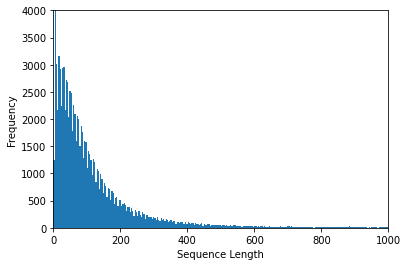

In [12]:
plt.hist(lens,1000)
plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.axis([0, 1000, 0, 4000])
plt.show()

In [38]:
# 计算句子向量
sentences = []
a = np.zeros(200, dtype=np.float32)
for s in data["body"]:
    for word in s.split(' '):
        try:  
            wordv = wordVec[word]
        except:
            wordv = np.zeros(200, dtype=np.float32)
        a = a + wordv
        a = a * [0.5]
    sentences.append(a)
    a = np.zeros(200, dtype=np.float32)
# print(sentences)

In [39]:
np.save("sentences",sentences)

In [40]:
sentences = np.load("sentences.npy")
sentences[0]

array([ 0.01909264, -0.02895122, -0.19151636, -0.15829922, -0.04058726,
       -0.17695465, -0.21265669, -0.03633751,  0.10828563,  0.03056476,
        0.36103429, -0.37331185, -0.00931855,  0.31638424,  0.1610357 ,
       -0.11145839, -0.07405139,  0.07012422,  0.09958076,  0.05645936,
       -0.26405278,  0.13056727, -0.10822465, -0.02973984,  0.25454964,
       -0.22849697,  0.14178041,  0.11650309, -0.16997699,  0.16884907,
        0.03939692,  0.21799942, -0.46361684, -0.09059808,  0.26494352,
       -0.11954584,  0.23919192,  0.11511991,  0.03701737,  0.01284786,
        0.14642378, -0.4627884 ,  0.05723805,  0.10680712,  0.0650731 ,
        0.2008699 ,  0.02362037, -0.29132688,  0.07615999, -0.24204813,
       -0.22153171, -0.03166489,  0.15044054,  0.21034208, -0.31322092,
        0.15882576,  0.01399909,  0.0910937 ,  0.22190586,  0.1268312 ,
       -0.14123376,  0.01344316, -0.25681255,  0.34979939,  0.17339585,
       -0.01143569, -0.21493675, -0.02232635,  0.16971761, -0.05

In [17]:
# 降维，可视化前1000个句子向量
pca = PCA(n_components=2)
result = pca.fit_transform(sentences[0:1000])

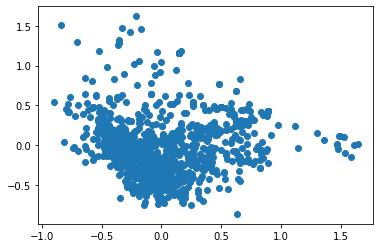

In [18]:
plt.scatter(result[:, 0], result[:, 1])

In [41]:
# 和某个单词关系最近的10个单向量
wordVec.most_similar(['log'])

2021-01-04 10:42:06,722 : INFO : precomputing L2-norms of word weight vectors


[('clog', 0.5866254568099976),
 ('logerror', 0.5443867444992065),
 ('logging', 0.5403066277503967),
 ('logdebug', 0.5160045027732849),
 ('loggingadapter', 0.5140599012374878),
 ('myown', 0.49966979026794434),
 ('logged', 0.49361056089401245),
 ('quiet', 0.4918431341648102),
 ('warn', 0.49162790179252625),
 ('prints', 0.48765087127685547)]

In [131]:
clusters = 200

In [132]:
# 句子向量聚类
# n_clusters=100 表示分100个类
kmeans = KMeans(n_clusters=clusters, random_state=1).fit(sentences)

In [133]:
y_pred = kmeans.labels_
cluster_center = pd.DataFrame(kmeans.cluster_centers_)
x_out = pd.DataFrame(sentences,index=kmeans.labels_)
x_outwithcenter=x_out.append(cluster_center)

In [134]:
from collections import Counter

center_dict = Counter(y_pred)
center_dict

Counter({7: 981,
         74: 695,
         18: 1750,
         153: 1178,
         35: 543,
         72: 1390,
         175: 1441,
         174: 156,
         50: 1970,
         28: 1071,
         26: 738,
         101: 93,
         183: 155,
         147: 1664,
         75: 1686,
         13: 1772,
         69: 241,
         40: 784,
         43: 1794,
         8: 785,
         54: 4727,
         198: 1656,
         190: 100,
         86: 179,
         6: 323,
         45: 584,
         20: 705,
         148: 282,
         11: 1197,
         160: 102,
         97: 1792,
         48: 198,
         12: 2413,
         179: 309,
         51: 388,
         23: 518,
         38: 588,
         81: 661,
         149: 75,
         185: 111,
         172: 297,
         10: 830,
         87: 563,
         41: 515,
         104: 315,
         71: 3300,
         178: 244,
         25: 770,
         34: 541,
         4: 1132,
         177: 362,
         122: 1157,
         199: 965,
         164: 1

In [135]:
#用TSNE进行数据降维并展示聚类结果
tsne = TSNE()
tsne.fit_transform(x_outwithcenter) #进行数据降维,并返回结果
x_tsne = pd.DataFrame(tsne.embedding_, index = x_outwithcenter.index)
#将index化成原本的数据的index，tsne后index会变化

In [136]:
# 第0个聚类的center
d = x_tsne[x_tsne.index == 0].tail(1)
d

,0,1
0,-1.213263,-2.322379


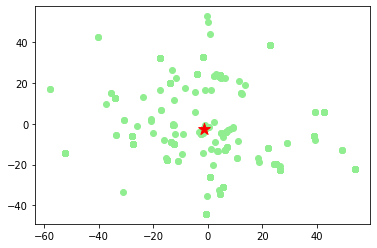

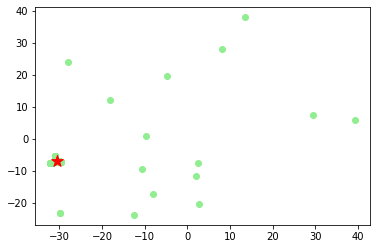

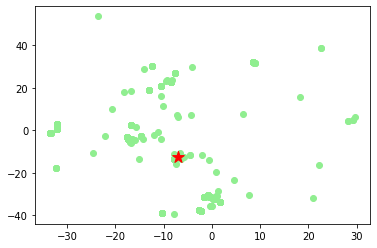

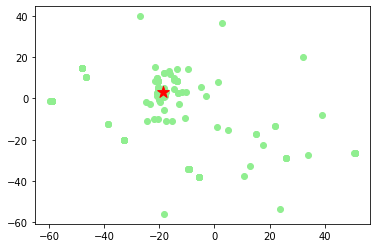

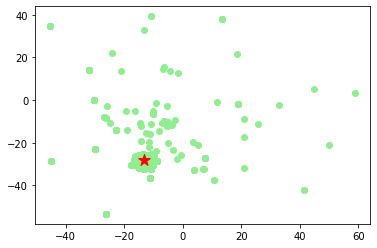

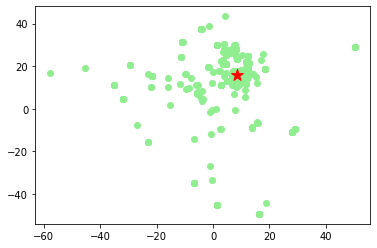

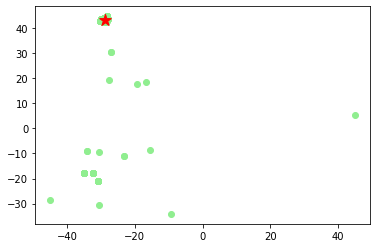

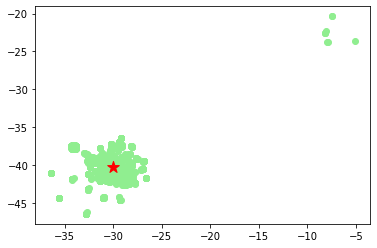

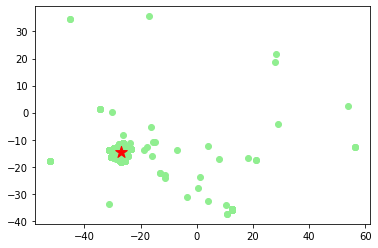

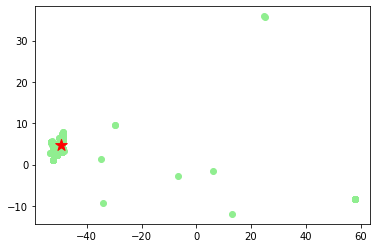

In [137]:
for i in range(10): 
    d = x_tsne[x_tsne.index == i]     #找出聚类类别为0的数据对应的降维结果
    plt.scatter(d[0], d[1],c='lightgreen', marker='o')
    d = x_tsne[x_tsne.index == i].tail(1)
    plt.scatter(d[0], d[1], c='red',s=150, marker='*')
    plt.show()
#     d = x_tsne[x_tsne.index == i]
#     plt.scatter(d[0], d[1], c='orange', marker='o')
#     d = x_tsne[x_tsne.index == i].tail(1)
#     plt.scatter(d[0], d[1], c='red',s=150, marker='*')
#     plt.show()
#     d = x_tsne[x_tsne.index == i]
#     plt.scatter(d[0], d[1], c='lightblue', marker='o')
#     d = x_tsne[x_tsne.index == i].tail(1)
#     plt.scatter(d[0], d[1], c='red',s=150, marker='*')
#     plt.show()
#取中心点，画出
# d = x_tsne.tail(3)
# plt.scatter(d[0], d[1], c='red',s=150, marker='*')
# plt.show()

In [138]:
res0Series = pd.Series(kmeans.labels_)
res0 = res0Series[res0Series.values == 8]
res0.index

Int64Index([   24,   168,   205,   276,   316,   409,   421,   667,   676,
              827,
            ...
            98303, 98385, 98501, 98787, 98827, 99486, 99662, 99738, 99912,
            99942],
           dtype='int64', length=785)

In [ ]:
# words_in_group_1 = []
# for item in res0Series[res0Series.values == 1].index:
#     words_in_group_1.append(data['body'][item])
# words_in_group_1

In [ ]:
# words1 = []
# for item in res0Series[res0Series.values == 1].index:
#     temps = []
#     for word in data['body'][item].split(' '):
#         if(word is not ''):
#             temps.append(word)
#     words1.append(temps)
# words1

In [ ]:
# dictionary = corpora.Dictionary(words1)  #生成字典,且对词语编号Id
# for key,value in dictionary.items():
#     print(key,value)

In [ ]:
# dictionary[4665]

In [ ]:
# new_corpus = [dictionary.doc2bow(text) for text in words1]
# new_corpus

In [ ]:
# tfidf = models.TfidfModel(new_corpus) #训练的模型
# #载入模型得到单词的tfidf值
# tfidf_vec = []
# for i in range(len(words_in_group_1)):
#     string = words_in_group_1[i]
#     string_bow = dictionary.doc2bow(string.lower().split())
#     string_tfidf = tfidf[string_bow]
#     tfidf_vec.append(string_tfidf)
# tfidf_vec

In [ ]:
# tfidf_vec[0]

In [139]:
# 原始语料
longcontents = []
for i in range(clusters):
    longcontent = ""
    for item in res0Series[res0Series.values == i].index:
        longcontent = longcontent + " " + data['body'][item]
    longcontents.append(longcontent)
len(longcontents)

200

In [140]:
# 分词
seg_list = []
for i in range(len(longcontents)):
    tempseg = []
    for word in longcontents[i].split(' '):
        if word is not ' ':
            tempseg.append(word)
    seg_list.append(tempseg)
len(seg_list)

200

In [141]:
dictionary = corpora.Dictionary(seg_list)  #生成字典,且对词语编号Id
for key,value in dictionary.items():
    print(key,value)

2021-01-04 15:57:29,823 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2021-01-04 15:57:31,143 : INFO : built Dictionary(84694 unique tokens: ['', '#', '#5759', '#6578', '#include']...) from 200 documents (total 2689315 corpus positions)


0 
1 #
2 #5759
3 #6578
4 #include
5 #{datastore[sleep]}
6 $
7 $asset-geterror
8 $child-isvalid
9 $choices
10 $data
11 $deep
12 $error[$errorcode]
13 $flatten
14 $handler
15 $msg
16 $this-context-expects
17 $this-fail
18 $this-never
19 %
20 %d
21 %r
22 %s
23 &
24 &&
25 &q[0
26 &q[ii
27 *
28 **
29 **init**
30 **kwargs
31 **minimal
32 **stof**
33 **the
34 +
35 +-
36 +1
37 +com_media_error_file_exists_override=a
38 -
39 --
40 ---
41 --follow
42 --strict
43 -1
44 -deprecation
45 -e
46 -f
47 -o
48 -q
49 -w_ii
50 -xlint
51 0
52 0-m4
53 0-m4-0-g8b41240
54 0001
55 05
56 06
57 0666
58 0]
59 0xfe
60 1
61 10
62 1048576
63 11
64 11887
65 12
66 123477
67 123485
68 1274
69 1293
70 1294
71 1295
72 178]
73 1ms
74 1st
75 2
76 2+
77 2000
78 2000]
79 2013]
80 254
81 255
82 26
83 27
84 28
85 2d
86 3
87 3038408704
88 365-375
89 3]
90 3d
91 3enwriting-tests-for-phpunit
92 4
93 400
94 42
95 435
96 439
97 453125
98 460938
99 4k
100 4xx
101 5
102 50
103 500
104 5474
105 57
106 6
107 7
108 70
109 79
110 796875
1

1540 linkedclassofclass
1541 linters
1542 linux
1543 list
1544 listener
1545 listeners
1546 little
1547 live
1548 load
1549 loadclass
1550 local
1551 localized
1552 locally
1553 lock-up
1554 log
1555 logf
1556 logged
1557 logger
1558 logging
1559 logic
1560 logicexception
1561 loglevel
1562 loglog
1563 logo
1564 logs
1565 logservice;
1566 logservicetracker
1567 logsource
1568 long
1569 longer
1570 look
1571 look-ups
1572 looking
1573 looks
1574 lookup
1575 loop
1576 loops
1577 loose
1578 lose
1579 losing
1580 loss
1581 lost
1582 lot
1583 love
1584 lxml
1585 m2
1586 m_codec
1587 m_defaulticon
1588 m_stereomodesetbyuser
1589 macro
1590 macros
1591 magic
1592 mainly
1593 maintaining
1594 majorly
1595 make
1596 makes
1597 making
1598 malloccallocrealloc
1599 management
1600 managementcommand
1601 manager
1602 many
1603 map
1604 mapped
1605 mapping
1606 maps
1607 marginally
1608 mark
1609 marked
1610 masked
1611 master
1612 match
1613 matches
1614 matching
1615 mate
1616 matrix
1617 matter


3044 attempt
3045 author
3046 auto-generated
3047 autocompletion
3048 aux
3049 avoids
3050 bandwidth
3051 barely
3052 based_
3053 bgr
3054 booleans
3055 borrow
3056 browser
3057 btw
3058 bugger
3059 built-in
3060 bump
3061 callmenum
3062 came
3063 canister
3064 cares
3065 cc
3066 cents
3067 check_simple
3068 clarity
3069 clean
3070 cleaned
3071 clickon
3072 clustering
3073 coeffs
3074 collections
3075 combinators
3076 commenting
3077 comments
3078 committed
3079 communicate
3080 commutative
3081 comparing
3082 completeness
3083 computationally
3084 concerning
3085 conflates
3086 confuse
3087 confusing;
3088 connect
3089 connected
3090 considers
3091 constant
3092 constructors
3093 constructur
3094 contenttypes
3095 controller
3096 controllers
3097 cool
3098 correctly
3099 corrupted
3100 course
3101 crashes
3102 crazy
3103 ctrl-c
3104 customize
3105 cv
3106 cv_exports
3107 cwe
3108 database]
3109 datastore[execute]
3110 datastream
3111 date
3112 davis
3113 dc
3114 dcs
3115 ddosing
3116 

4540 db_manager
4541 decimal
4542 default_locale
4543 delaying
4544 deliberating
4545 delimited
4546 delimiter
4547 depends
4548 deps
4549 describe
4550 deserve
4551 designed
4552 designs
4553 destination
4554 details
4555 developping
4556 devices
4557 diagnostic
4558 dial
4559 differ
4560 dir
4561 direction
4562 disable-functions
4563 disable_winjoystick
4564 disclaimer
4565 disconnect
4566 discovered
4567 dispatcherid
4568 docblock
4569 docblocks
4570 doctrinebundle
4571 dominic
4572 double-quotes
4573 double_t
4574 drag
4575 drawing
4576 drivers
4577 drives
4578 duplicated
4579 edits
4580 emulated
4581 en
4582 en_us
4583 encoder
4584 encoders
4585 encoding
4586 ended
4587 engineer
4588 enhancer
4589 enterprise
4590 enums
4591 envision
4592 erb
4593 escape
4594 establishing
4595 estimators
4596 exceptioninterface
4597 experiment
4598 explantation
4599 explicity
4600 exploitation
4601 export
4602 exported
4603 extract
4604 extracted
4605 extractorinterface
4606 fail_with
4607 failurer

6235 outcomes
6236 outdated
6237 overhead
6238 overridden
6239 override_settings
6240 overriden
6241 owners
6242 packet
6243 packs
6244 pairs
6245 paradise
6246 param_name
6247 param_range
6248 paramaccessor
6249 parameterbag
6250 parameterize
6251 parenthetical
6252 parse
6253 parse_url
6254 part;
6255 partial_fit
6256 partial_fit_classifier
6257 partial_fit_regressor
6258 passive
6259 password[jeff@jschroeder1
6260 patched
6261 pathtoreact-tools-version
6262 patient
6263 patterns
6264 payload
6265 peeknode
6266 peer
6267 penalizing
6268 pendingdeprecationwarning
6269 perfect
6270 performed
6271 periods
6272 permissions
6273 pg
6274 phase
6275 php#datetime
6276 php#l105-l111
6277 php#l185
6278 picklability
6279 picky
6280 piece
6281 pike
6282 pile
6283 pinneddispatchers
6284 pinv
6285 pixie
6286 pk
6287 pkgmflag
6288 pkgmounts
6289 pl
6290 planet
6291 playing
6292 pleasure
6293 pls
6294 plurals
6295 pm
6296 pmt
6297 po
6298 point&
6299 pointed
6300 poisonpill
6301 port_*
6302 post_syn

7777 lists
7778 literally
7779 lmap
7780 loadings
7781 loadpix
7782 loc[
7783 local_child
7784 localactorref
7785 localhomejenkinsakkaworkspacepr-validator-per-commitakka-actor-testssrctestscalaakkapatternaskspec
7786 localmembers
7787 localtyper
7788 locationstring
7789 lock-less
7790 locking
7791 loct
7792 logevent
7793 loggingadapter
7794 loggingreceive
7795 longvalue
7796 lookup_parts[0
7797 lookup_sep
7798 looping
7799 loser
7800 lowercase
7801 lstrip
7802 luck
7803 lut_
7804 m_block_pos
7805 m_block_size
7806 m_pictureextensions
7807 m_services
7808 macrobodytypecheckexception
7809 macroimplementationnotfounderror
7810 magical
7811 magicimplicit
7812 mail-archive
7813 mailing
7814 maintained
7815 make[1]
7816 make_mapping
7817 maketransparent
7818 malformed
7819 map[address
7820 mapfrom
7821 master3
7822 mat&
7823 match_data
7824 matchbuilder
7825 matcherror
7826 materializer
7827 materializersettings
7828 maxthon
7829 maxvalue
7830 mb
7831 mdc
7832 mean_scores
7833 meaningless
7

9289 formulae
9290 friendly
9291 frustrating
9292 gaaaaa
9293 geoadmin
9294 get_input_stream
9295 get_once
9296 get_rdymsg
9297 get_yscale
9298 getcolumnwidth
9299 getinitialstate
9300 getmessages
9301 getnumberofcolumns
9302 geturi
9303 godd
9304 gods
9305 google-searchable
9306 green_heart
9307 grows
9308 habilitate
9309 hah
9310 headers-titles
9311 hh
9312 hils
9313 homengrymancodeopencvmodulescoreincludeopencv2corecore
9314 homengrymancodeopencvmoduleshighguitesttest_grfmt
9315 hop
9316 hopefully
9317 horizontally
9318 hows
9319 howwhy
9320 html#squashing-commits
9321 hy
9322 hyperbolic
9323 i++
9324 i+1
9325 ideaexample
9326 ids
9327 ignorance
9328 ilog
9329 img
9330 impl;
9331 imwrite
9332 increases
9333 increment_counter
9334 increment_counters
9335 indicates
9336 initialproducts
9337 initialproducts}
9338 instanceof
9339 instructions
9340 intend
9341 interactively
9342 interchangeably
9343 ipcas
9344 itemid
9345 ivan
9346 jerror
9347 jgor
9348 jinput
9349 jpg
9350 jrequest
9351

10575 winrm_poke
10576 with_gstreamer_1_x
10577 with_gtk_2_x
10578 wm_paint
10579 wonderful
10580 woops
10581 workspace
10582 write_to
10583 writereplace
10584 x-docker-endpoints
10585 x_step
10586 xbmc-xranr
10587 xorg
10588 xpath
10589 yearoffset
10590 zeknox
10591 zen
10592 zlib
10593 {current_pid
10594 {file
10595 ~5
10596 “elements”
10597 #1563
10598 $admin
10599 $category
10600 $context
10601 $id$
10602 $this-category
10603 +dependent+
10604 -]i
10605 0-gothamxbmcaddon
10606 2006
10607 2310
10608 2390
10609 60
10610 64bit
10611 @amystephen
10612 @author
10613 @constant
10614 @elenagvozdeva
10615 @jfrazelle
10616 @josevalim
10617 [^a-z0-9_
10618 [jdatabasedriversqlsrv
10619 __main__
10620 _a
10621 _as
10622 _braces_
10623 _callback
10624 _pure
10625 _shebang_
10626 _should_
10627 accesses
10628 accomplishing
10629 additions
10630 aid
10631 air
10632 ambivalent
10633 app-thread
10634 appending
10635 array_unique
10636 autogenerated
10637 backslash
10638 balloons
10639 band-aid
1064

12145 mock
12146 mocked
12147 mocking
12148 modcontactsinfohelper
12149 module_tag
12150 moments
12151 moments_oclsrc
12152 morning
12153 movielist
12154 mr
12155 mt
12156 multi-byte
12157 multi_class
12158 multibyte
12159 multipath
12160 mutates
12161 myclass
12162 mycomponent
12163 myhttputils
12164 mypid
12165 nags
12166 nah
12167 nanotime
12168 near
12169 need_convert
12170 newbie
12171 nextname
12172 nextsib
12173 nextsibling;
12174 nicolas
12175 nits
12176 node-insertbeforechild
12177 nok
12178 non-flatten
12179 non-numeric
12180 non-sanitized
12181 non-stl
12182 norm_l1
12183 normcapacity
12184 note--
12185 notempty
12186 now-then
12187 nowadays
12188 npos
12189 nu
12190 num
12191 num_planes;
12192 nvm
12193 objectof
12194 obscurity
12195 observer
12196 obstinacy
12197 ocl_test_cycle
12198 oclresult
12199 oclresult;
12200 ofc
12201 offers
12202 officially
12203 offset_of
12204 oil
12205 oldish
12206 onconsecutivecalls
12207 one-vs-rest
12208 onmessage
12209 oob_improvement_[
122

13576 info}
13577 infra
13578 initialautorunscript
13579 initialised
13580 initiliaze
13581 inliers_rate
13582 inserting
13583 inspecting
13584 inspector
13585 instance-only
13586 insure
13587 integrations
13588 intending
13589 interacts
13590 interest
13591 interface][fluent]
13592 interleaved
13593 internal_error
13594 interpolated
13595 interpolator
13596 intex
13597 intro
13598 introductory
13599 introspection
13600 intuitve
13601 invariants
13602 iodocsakkasnapshotgeneralsupervision
13603 ip
13604 ipaddr
13605 ipformatvalidator
13606 ipp_check
13607 iproute2
13608 iptables
13609 ipv4
13610 is_a
13611 is_app_config
13612 is_app_ironport
13613 is_int
13614 is_integer_dtype
13615 is_system
13616 iscyclicorerroneous
13617 isent
13618 isinstanceissubclass
13619 isinstanceof[erroremitted]
13620 ismacro
13621 isolate
13622 issettingvisible
13623 issilent
13624 issue]
13625 isterminate-check
13626 istextinputenabled
13627 is—how
13628 iterablesource
13629 iv
13630 i’m
13631 javascriptexpl

15288 class=reallyopen
15289 classes_[0]
15290 classifiers_
15291 classmethod
15292 classmethodfunction
15293 classobj
15294 classof[numberformatexception
15295 class|default
15296 clean_title
15297 clf_params
15298 client=true
15299 club
15300 clusterclientspec
15301 clusterreceptionistextension
15302 clusterstats}
15303 cluttering
15304 cm
15305 cmd_length]
15306 cmp
15307 coef_path_continuous
15308 coef_path_lars[
15309 coefs_paths_
15310 coercing
15311 coercion
15312 collation
15313 collection_select
15314 collectionproxy
15315 collision
15316 colorize
15317 column_name
15318 column_types[name]
15319 columns=[a
15320 columns=[x
15321 com_media
15322 com_menus_menu_type_not_allowed=this
15323 combradleybudarailsblobdd1114240c641079f1677240c5e68721a253744bactionpacklibaction_controllerauthenticity_token
15324 comdockerdockerblamemasterdocssourcesreferencecommandlinecli
15325 comenlatesttopicseventmaster_events
15326 comfinancehistorical
15327 comjoomlajoomla-cmsblobstaginglibrariescm

16615 result2
16616 result5
16617 resulted
16618 ret]
16619 retcode
16620 retcode]
16621 retry
16622 retry_interval
16623 retrykey
16624 retuned
16625 returndfval
16626 returndfval=false
16627 returnes
16628 reused_f
16629 reused_fs
16630 reverse=true
16631 rewhere
16632 rfe
16633 rnd
16634 rollbacked
16635 rolling_kurt
16636 root_queryset
16637 roundabout
16638 route_data
16639 route_item
16640 rp
16641 ruby-doc
16642 rubyism
16643 rubyist
16644 rubys
16645 rudolph
16646 ruin
16647 run_all]
16648 run_cvt_perf_test
16649 rvs
16650 rwm
16651 s0
16652 s[[2
16653 s[fancy_idx]
16654 sacraficing
16655 safe_sparse_dot
16656 saltenv
16657 salts
16658 saltstack
16659 saltsystemexit
16660 sample_mask
16661 sample_weight
16662 sampled_params
16663 saturation
16664 save_changed_attribute
16665 saved_registers
16666 scaler
16667 scancode
16668 scatter
16669 scheduleonce
16670 scikit-learns
16671 score_func
16672 scorer
16673 scores
16674 scores_
16675 scraping
16676 screaming_snake_case
16677 scri

18287 implementaion
18288 increasing
18289 inhibits
18290 initializes
18291 input_type
18292 inputarray;
18293 interchangable
18294 intermediary
18295 intobjecthashmap
18296 introspected
18297 int|float
18298 invariance
18299 ipp-a
18300 irectly
18301 isavailable
18302 isinf
18303 isn’t
18304 isoformat
18305 isprocessingmessage
18306 isticking
18307 jars
18308 java7
18309 javac
18310 javaserializer
18311 jdk
18312 keepconfig
18313 labeled
18314 latestgossip
18315 legible
18316 lenghts
18317 length-sampling
18318 libraryframeworkspython
18319 limit=1
18320 limiting
18321 line-wrapping
18322 linearregression
18323 linksys
18324 listings
18325 loadsave
18326 localize
18327 log10
18328 logarithm
18329 loopduration
18330 lotus
18331 lowest
18332 lpcm
18333 luckily
18334 lump
18335 m_channelitems
18336 m_currentaudio
18337 m_currentvideo
18338 m_iidshow
18339 m_pclock-getclock
18340 m_started
18341 make_regression
18342 marginal
18343 mattered
18344 max_depth
18345 max_features
18346 max_tri

19787 comrapid7metasploit-frameworkpull2931files#r9790461
19788 comtiger-seo67a6e8e7177b3b6c104d
19789 comxbmcxbmcblobmasterxbmccoresdvdplayerdvdcodecsvideovdpau
19790 comxbmcxbmcpull3326files#l3r180
19791 concurrenthasmap
19792 concurrentlinkedqueue
19793 condition-waitspin
19794 confidential
19795 config_dir
19796 confirmations
19797 confirmedclosed
19798 confusingly
19799 conj
19800 conjugate
19801 conneciton
19802 connectionclosed
19803 connectionimpl
19804 connectionpool
19805 connectionrefused
19806 consumed
19807 containable
19808 containerawareeventdispatcherinterface
19809 containerpause
19810 context-menu
19811 contextclassloader
19812 contextmenuclose
19813 continues
19814 continuosly
19815 contra
19816 contraction
19817 contravariant
19818 conventional
19819 converttofloat
19820 convincing
19821 coords
19822 copyrighted
19823 copytyperef
19824 correcly
19825 counts
19826 cplayercontroller
19827 cpp#l1055
19828 cprocessor
19829 crafted
19830 crappy
19831 crashed
19832 create

21287 $feed-body
21288 $reader-xml
21289 $times
21290 --device
21291 -run
21292 179
21293 182
21294 183
21295 200m
21296 355
21297 <%-
21298 =salt%b
21299 =salteeb
21300 @nomack84
21301 @snipersister
21302 [^]*
21303 ^testbuild$
21304 _an_
21305 _for
21306 a*
21307 a*b
21308 aha~
21309 annoyed
21310 asddbfile
21311 attrhints
21312 attribute;
21313 attributes=
21314 balanced
21315 barrierop
21316 beforeafter
21317 bevor
21318 block;
21319 bools
21320 bout
21321 buckets
21322 c*d
21323 c-base
21324 capability
21325 caps
21326 casts
21327 choicelenght
21328 commandlines
21329 concatenating
21330 consequent
21331 constuctor
21332 continuous-
21333 contribadmin
21334 coreurlresolvers
21335 crazy-long
21336 cs]
21337 csrf_test
21338 cursory
21339 datastore[auth_uri]
21340 datastore[filename]
21341 discrete
21342 dolar
21343 dollar
21344 encodedecode
21345 endling
21346 endswidth
21347 epanechnikov
21348 eqne
21349 explore
21350 faces
21351 forgeting
21352 fulltext
21353 grant
21354 grid-sear

22547 @client
22548 @cmaruti
22549 @copyright
22550 @cptspiff
22551 @digininjahttps
22552 @echo
22553 @egyp7
22554 @env[content_length]
22555 @env[raw_post_data]
22556 @erikh
22557 @george
22558 @hayd
22559 @input_html_options
22560 @java
22561 @jeremys
22562 @kgray-r7
22563 @ktonga
22564 @license
22565 @lines
22566 @liuxing6666
22567 @ln
22568 @lologhi
22569 @magarciaepfl
22570 @mkdir
22571 @new_record_before_save
22572 @option
22573 @package
22574 @paramhttps
22575 @payload_exe
22576 @pxli168
22577 @resolver
22578 @returnhttps
22579 @rm
22580 @serializer
22581 @session_cookie
22582 @staticmethod
22583 @subpackage
22584 @theunihttps
22585 @threadnum
22586 @todb
22587 @trigger_error
22588 @use_android@
22589 @use_libxbmc@
22590 @vigdorchik
22591 @wait_index
22592 @woodspire
22593 @wvu
22594 @wvu-r7
22595 [${nodes
22596 [${selfaddress}]
22597 [%s]
22598 [%x{requestid}
22599 [-1]
22600 [-8
22601 [0-9]+
22602 [0-9]{1
22603 [01]
22604 [100k]
22605 [10m]
22606 [11
22607 [1m]
22608 [7
22609 

24286 ewmvar
24287 ewmvol
24288 examine
24289 examplesapplicationsplot_out_of_core_classification
24290 examplesclusterplot_ward_structured_vs_unstructured
24291 examplesplot_precision_recall
24292 examplesrcmainjavaionettyexamplespdyclientspdyclient
24293 examplesrcmainjavaionettyexamplespdyclientspdyframelogger
24294 excellence
24295 excellent;
24296 exception_pointers*
24297 exception_result_prefix
24298 exceptionresult
24299 excited
24300 exec_cmd
24301 exec_in_mem
24302 exec_query
24303 execfile
24304 execin
24305 execute_cmdstager
24306 executorserviceconfigurator
24307 executorservicefactory
24308 exemplary
24309 expandeddoccomment
24310 expectmsgpf
24311 expectmsgtype
24312 expectmsgtype[actorref]
24313 experiencedexport
24314 explicit_arch
24315 exploit-db
24316 exploit_simple
24317 exploitremotebrowser_exploit_server
24318 exploitremotehttpbrowser_exploit_server
24319 exponential
24320 exports
24321 expres
24322 ext_matches
24323 ext_matches[saltenv]
24324 ext_nodes
24325 ext

26036 raise_error
26037 raman
26038 rand_text_alpha_lower
26039 random_idxs
26040 rantil
26041 rapid7metasploit-frameworkcc
26042 rapid7metasploit-frameworkreply
26043 rateofdecay
26044 ravunnikutty
26045 raw_post_body
26046 raw_value
26047 rawdoccomment
26048 rawsym
26049 raymond
26050 rb#l214
26051 rbfsampler
26052 rbpi
26053 re-consider
26054 re-entrantly
26055 re-ran
26056 re-review
26057 re-writing
26058 react-tools
26059 reacting
26060 reactor
26061 read_cached
26062 read_clipboard
26063 read_entry
26064 read_frame
26065 read_html
26066 read_multi_stream
26067 read_server_structs
26068 read_sql
26069 readerwriter
26070 readinbound
26071 readlines
26072 readlistfrom
26073 readmes
26074 reap_fileserver_cache_dir
26075 reapunreachablemembers
26076 reapunreachabletick
26077 reason_bad_origin
26078 reattach
26079 rebalancing
26080 rebert
26081 receipt
26082 receivegossip
26083 receivers
26084 recipient_list
26085 reclaim
26086 recognizes
26087 reconnectafter
26088 reconnections
26089 

27561 $propertypath
27562 $q-field
27563 $qb-andwhere
27564 $qb-expr
27565 $qb-getrootalias
27566 $read
27567 $request-is
27568 $request-ismethod
27569 $resolver-resolve
27570 $rootfsdir
27571 $rootfsdirvarlibaptlists*
27572 $route-hasscheme
27573 $safeupdatemode
27574 $scalarlower
27575 $script_user_agent
27576 $set_default
27577 $setcodes[]
27578 $settings
27579 $something
27580 $str_split_width
27581 $strlen
27582 $table-dispatchevent
27583 $taggedlisteners
27584 $taggedsubscribers
27585 $tags
27586 $this-_alias
27587 $this-_appropriatename
27588 $this-_data
27589 $this-_mapper;
27590 $this-alias
27591 $this-app
27592 $this-app-getmenu
27593 $this-attachment[$index]
27594 $this-attachment[0]
27595 $this-attributes
27596 $this-authenticationmanager-authenticate
27597 $this-class
27598 $this-context-addviolation
27599 $this-context-setpropertypath
27600 $this-dispatcher
27601 $this-elements[$index]
27602 $this-environment
27603 $this-form-input
27604 $this-get
27605 $this-getapplicati

28891 amc
28892 amd64
28893 amdahls
28894 amemended
28895 amendment
28896 american
28897 amplifiers
28898 anal
28899 analogy
28900 analyser
28901 analytical
28902 analyze
28903 analyzer
28904 analyzerplugins
28905 ancestor
28906 ancho
28907 anchored
28908 anchors
28909 andrew
28910 androidpackage
28911 animated
28912 animation
28913 anker-tag
28914 annotating
28915 annotationcheckers
28916 annotationretentionattr
28917 announced
28918 announcer
28919 announcing
28920 annoyance
28921 anonymize
28922 anonymousgeneric
28923 anonymoustoken
28924 anothercounter-100
28925 ansicolor
28926 ant-overlord
28927 antecedent
28928 anti-exception
28929 anticipated
28930 antwerp
28931 any2stringadd
28932 anyall
28933 anymore…
28934 anything-
28935 anyvalidatortest
28936 anyway_
28937 anyùore
28938 aoround
28939 apc
28940 apccache
28941 ape
28942 aphabetized
28943 api;
28944 apirun
28945 app;
28946 appcache
28947 appcontrollerserrors_controller
28948 appdata
28949 appdispatcher
28950 appeal
28951 appea

30535 e7827b94940860d6af737b5ea0105b6460cba53c
30536 e79c9f7
30537 e7d3819
30538 e9a456d11b5b63389b466ed435ef3915f0e79e4c
30539 each_key
30540 eachother
30541 eaf1aa06d37d29eac7e3f5115933dac683285ed6
30542 eagerloader
30543 earilier
30544 earlier;
30545 earlier]
30546 early-comers
30547 early”
30548 earstail
30549 easilly
30550 easilycleanly
30551 easilyintuitively
30552 easter
30553 easy-rsa-2
30554 easy_aquire
30555 eat
30556 eaten
30557 eb6420}
30558 ebuild
30559 echoed
30560 echoes
30561 echoing
30562 ecma-international
30563 ecmlpkdd
30564 ecosystem
30565 edge-cases
30566 edit2
30567 edit]
30568 editor-context-menu
30569 edu~jerryzhupubcmu-cald-02-107
30570 edu~jerryzhupublications
30571 edu~jerryzhupubzgl
30572 eec01e79ff44a36b788ea37c8a85fde0fbb4f72c
30573 eeef074
30574 eeh
30575 een
30576 eent
30577 effective_default
30578 egg
30579 eggs
30580 eglfinalize
30581 ehealth_fingerprint
30582 ehealth®
30583 ehlo
30584 eigen
30585 eigendecomposition
30586 eigensolver
30587 eigvals
305

32035 l89
32036 labcoat_cmoalt
32037 label;
32038 label_binarize
32039 label_sequence
32040 labeldef
32041 lafferty
32042 lag
32043 lagging
32044 lal
32045 lala
32046 landmine
32047 lands
32048 lang_info
32049 langinfo
32050 lapack
32051 largeclusterspec
32052 largeish
32053 lastindexwhere
32054 lastly
32055 lastprops
32056 laststdconversiontype
32057 latejoiners
32058 later-on
32059 later”
32060 latin1_swedish_ci
32061 laugh
32062 laughing
32063 laundry
32064 lay
32065 layman
32066 lazy_list
32067 lbd
32068 lbq
32069 lc_*
32070 ldapauthenficationprovider
32071 ldflags
32072 ldvydvsq
32073 le-roux
32074 leaderchangedbuffer
32075 leaderof
32076 leakage
32077 lean
32078 leaning
32079 leans
32080 leap
32081 leapfrog
32082 learnt
32083 leave-one-out
32084 leavecascade;
32085 leaveonelabelout
32086 leaveoneout
32087 leavepout
32088 left-over
32089 leftright
32090 legends
32091 less;
32092 lethals
32093 letters”
32094 letting
32095 level]
32096 leveranging
32097 lgamma
32098 lgpl
32099 lgt
3

33535 proofs
33536 propagation
33537 propelruntimemapcolumnmap
33538 propertyaccessor
33539 propery
33540 proprietary
33541 props[myactor]
33542 protect_from_forgery
33543 protectedweb_arr
33544 protects
33545 protobuffed
33546 protobufproducer
33547 protocolforname
33548 prototypeargs
33549 prototypes
33550 provision
33551 proxymanagers
33552 pruned
33553 pruning
33554 pseudo
33555 pseudo-lh
33556 pseudocodish
33557 pseudonym
33558 pseudorandom
33559 psql
33560 psuevdo
33561 psych
33562 ptchecked
33563 ptonejiffylab
33564 ptr<
33565 ptr<exposedinterface
33566 ptrdiff_t
33567 pts_wrap_bits
33568 pubdate
33569 public-facing
33570 publication
33571 publish-plugin-commands
33572 published_date
33573 publisher[unit]
33574 publisher_id
33575 publishers
33576 publisherssubscribers
33577 publisheventforplugin
33578 publishing
33579 publishregistrationname
33580 publishto
33581 pues
33582 pull-style
33583 pullreq
33584 pump-vents
33585 punished
33586 punny
33587 punto
33588 purgatory
33589 pur

35035 try-finally-setup
35036 tryall
35037 trycomplete
35038 tryresume
35039 trytry
35040 try{
35041 ts_arrtest
35042 tseriesteststest_timeseries
35043 tseriesteststest_timeseries_legacy
35044 tsoumakas
35045 tt#l27
35046 ttymode
35047 tu
35048 tucked
35049 tuff
35050 tunable
35051 tunnel
35052 tupleplaceholder
35053 tutorial19
35054 tvshow_multiple_path
35055 tweaking
35056 twig_filter_node
35057 twig_node_expression_array
35058 twig_test_node
35059 twigengine
35060 twine
35061 two-factor
35062 two-way
35063 txt#docstring-standard
35064 txt#known-failures-skipping-tests
35065 txt#l60
35066 tychonoff
35067 type&
35068 type-checking
35069 type-indexed
35070 type-safety
35071 type-selection
35072 type-to-dnstype
35073 type=string
35074 typeadaptingtransformer
35075 typebounds
35076 typechecked
35077 typedactor
35078 typedactors
35079 typedimplicit
35080 typedness
35081 typedrefinement
35082 typedselectinternal
35083 typedxyz
35084 typer-dependent
35085 types$uniquetypebounds
35086 typeta

36784 simplematch
36785 simpy
36786 size2
36787 slashcharacter
36788 someothertests
36789 sometests
36790 splfileobject
36791 squish
36792 str[1]
36793 stream_get_wrappers
36794 stripple
36795 strotoupper
36796 strtoupper
36797 symfonycomponentdomcrawlerfielddynamicformfield
36798 td2
36799 test2;
36800 testbuildwithinaccessiblefilesincontext
36801 testconduction
36802 testtest2
36803 tjos
36804 toggle_data
36805 tolower
36806 tpimplied
36807 translations[to]
36808 typehinting
36809 ucwords
36810 uniquebroadcastid
36811 upscaling
36812 use-sites
36813 usedbycontainerid
36814 utf-8}
36815 vararg
36816 vendorsymfonysrcsymfonybundletwigbundleresourcesviewsformdiv_layout
36817 vrfy
36818 warmup_none
36819 writen
36820 xfundepmaterialization
36821 xml_text_node
36822 yhm
36823 yyy
36824 {acceptcharset
36825 }n
36826 }}{%
36827 ~border_isolated;
36828 #--
36829 #6863
36830 #^memcache
36831 $host
36832 $itemelement
36833 $matches[1];
36834 $matches[2];
36835 $memcache
36836 $memcache-connect


38284 #{k}
38285 #{loot}
38286 #{method_prefix}#{method}
38287 #{method}
38288 #{my_payload}
38289 #{note
38290 #{options
38291 #{part
38292 #{path}
38293 #{phrase}i
38294 #{reflection
38295 #{results
38296 #{result}
38297 #{sep}
38298 #{target
38299 #{timestamp
38300 #{to}
38301 #{uri}
38302 #{valid_directions
38303 #{value}
38304 $driver-store
38305 %{name}
38306 %{}
38307 **not
38308 *enqueue_args|
38309 *orders
38310 *query
38311 *v
38312 +1030
38313 +205
38314 +port
38315 +tmov
38316 --#{k}
38317 --rn
38318 -1030
38319 -205
38320 -https
38321 -or-
38322 -seconds
38323 021c50d
38324 0c02496
38325 0x38
38326 1000}rn
38327 10_000
38328 10_123
38329 123456
38330 132
38331 134
38332 137
38333 139
38334 1}}
38335 30ish
38336 35ish
38337 4-byte
38338 <=w
38339 <faultstringi
38340 <linki
38341 <name
38342 <password
38343 <sysadminpassword
38344 <sysadminusername
38345 ==nil
38346 =integrity_level
38347 @@delivery_interceptors
38348 @@delivery_notification_observers
38349 @@sse_clients
383

39897 default”
39898 depth=1
39899 depth=4
39900 detention
39901 developper
39902 developpers
39903 dict_of_asked_selections
39904 digged
39905 django-admin
39906 djangoutilstranslationtrans_real
39907 dm#l1380
39908 do_itt_notify=0
39909 dogs
39910 electrode
39911 electrodes
39912 emitted
39913 entrance
39914 environement;
39915 errmode
39916 establish_connect
39917 ewrs_icons
39918 explicitness
39919 externalized
39920 fanin
39921 fdopen
39922 field_dict
39923 flag;
39924 flc
39925 fluffwise
39926 fmode
39927 freqs
39928 fulled
39929 fumbles
39930 gained
39931 generalization
39932 gentraversablefactory
39933 genus
39934 genus__family__order
39935 get*options
39936 get_attribute
39937 getaddrinfo
39938 getandset
39939 getcolumntypes
39940 getparameters
39941 gettrustedheadername
39942 glvoes
39943 goodness
39944 groupattributemixed
39945 hackery
39946 happens-before
39947 havemay
39948 header_client_ip
39949 hound
39950 html#os
39951 httpkernelinterface
39952 idcomparison
39953 idns
3

41489 attenuated
41490 attribue
41491 attribute_present
41492 attribute_value_present
41493 authcomponent
41494 autofield
41495 automation
41496 b-c
41497 backspace
41498 banning
41499 bby
41500 bea
41501 beforevalidate
41502 bic
41503 biclustering
41504 binarizer
41505 birth_date
41506 blackbeard
41507 blacklisted
41508 blas_opt
41509 blessed
41510 bloadprofile
41511 bootstrap=true
41512 both;
41513 bottle
41514 bsrcviewformentitycontext
41515 bu
41516 build_record
41517 cakeormentity
41518 can_introspect_boolean_field
41519 canoncial
41520 cec
41521 champaign
41522 checkhost-#{ip}
41523 chet
41524 chi2
41525 choke
41526 chpasswd
41527 citeria
41528 clear_table_cache
41529 clipped
41530 cloned_attributes
41531 clustermessageserializer
41532 com_banners_banners_n_items_archived=%d
41533 com_weblink
41534 com_weblinks_weblinks_n_items_archived=%d
41535 comarthurnnrailsblobtransactionsactiverecordtestcasesfixtures_test
41536 comexvivarailsblob2d2cbf22c9ef385595b4a01dd4947da90a0158f9activ

43033 lacked
43034 lambdamart
43035 laplacian
43036 lassoelasticnet
43037 last_tick_duration
43038 lastselectedline
43039 latin
43040 lb
43041 lbfgs
43042 lc_time
43043 left-leaning
43044 legibility
43045 lend
43046 lens
43047 lessen
43048 letitcrash
43049 levels[k]
43050 lg
43051 lied
43052 link_crawl_path
43053 link_os
43054 link_privilege
43055 link_server
43056 link_state
43057 link_user
43058 link_version
43059 linkcanonical
43060 liquid
43061 littles
43062 livelock
43063 load_field
43064 load_if_ruby
43065 load_models
43066 loadfromfileinternal
43067 local_fields
43068 logfile
43069 loginprovider
43070 longs
43071 lowers
43072 lowstate
43073 lsb_release
43074 lsd_refine_lvl
43075 lts
43076 ltsa
43077 lut_l[
43078 lut_l[idx&0xff];
43079 m_channellayout
43080 m_stats
43081 macos
43082 mahalanobis
43083 mainwindowproc
43084 makeptr<videocapture_dshow
43085 manageably
43086 managementutility
43087 manytomanyfield
43088 manytomanyrel
43089 mappersreducers
43090 mappingfiltering
43091 

44533 setout
44534 setproxyinstantiator
44535 settings_deadlock
44536 shiny
44537 shortage
44538 size;
44539 socker
44540 spoof
44541 sslcontext
44542 stepping
44543 stimulated
44544 storelogin
44545 strayed
44546 strrpos
44547 supress
44548 sympathy
44549 systembinapp_process
44550 tailchoppingrouter
44551 targetscrubber
44552 tcpconnection’s
44553 tech
44554 test_is_a
44555 thisd
44556 throne
44557 thyer
44558 timeoutduration
44559 tims
44560 to_
44561 to_embed
44562 todouble
44563 to “ignoring
44564 transisions
44565 translatelegacypath
44566 try-fainally
44567 tvshowsstudios
44568 tweetersphere
44569 u0_a4
44570 unittestoverrides
44571 unwatched
44572 updateauth
44573 updatelogin
44574 usrbinless
44575 utf-16
44576 uuups
44577 vc1
44578 vecrtor
44579 vt220
44580 waay
44581 waitframe
44582 whaat
44583 wheels
44584 writelogin
44585 x[x_sample_stride
44586 x_fx_stride
44587 x_weighted
44588 xf
44589 y_weighted
44590 yesno
44591 zombies
44592 {name
44593 {}]”
44594 м
44595 слишко
44596

46248 skiping
46249 sme
46250 snipplet
46251 sorded_signal
46252 soundly
46253 spans
46254 sponge
46255 stacked=false
46256 status=501
46257 stepped
46258 striking
46259 supid
46260 switchcase
46261 therubyracer
46262 theta
46263 thumbsdown
46264 thunkbasedlockingtypecompleter
46265 timedatacollector
46266 tricked
46267 undersand
46268 unstubs
46269 unweidly
46270 updateddate
46271 use_relative_delta
46272 value]
46273 valueerrors
46274 view_init
46275 wait_for_event
46276 watchunwatch
46277 width=
46278 x+
46279 x0c
46280 y_true]
46281 yell
46282 ~bufferpoolcontroller
46283 ~~tome
46284 “assert”
46285 $_categories
46286 $args[1]
46287 $config[enabled]
46288 $defaultsuccesshandleroptions
46289 $hints
46290 $mimetypes
46291 $set
46292 $tasks
46293 $this-elements
46294 $this-supportedloaders
46295 2*n+1
46296 @guilhermeblanco
46297 @mapping[lookup_key]
46298 [false]
46299 [implementation]
46300 [true]
46301 _ext
46302 _extract
46303 _full
46304 _key_
46305 add_column
46306 allfunctions
4

47602 5e
47603 5frameworkspython
47604 5srcsymfonycomponentdependencyinjectionloaderschemadicservicesservices-1
47605 5xx
47606 5}
47607 6**
47608 6000
47609 6031d5
47610 6031d582
47611 6031d585
47612 6031d588
47613 6031d58c
47614 6031d590
47615 6032b75b
47616 6032b8bb
47617 6032b8bc
47618 6032b8bd
47619 6032b8be
47620 609
47621 60hz
47622 60x
47623 61125707626343
47624 616150
47625 61875849
47626 61f5df9
47627 6200
47628 6290
47629 631
47630 6372
47631 63782]
47632 643ms
47633 645
47634 64_000
47635 64}
47636 65811
47637 661
47638 6620fd9014c59727c974b44e285e1faa4d341a5e
47639 674
47640 6788349151611328
47641 67dcea71
47642 68262100219727
47643 6829
47644 6863
47645 691
47646 693
47647 6944
47648 6a02
47649 6a08
47650 6afd4435
47651 6afd443b
47652 6afd443c
47653 6afd443d
47654 6afd443e
47655 6afd443f
47656 6bf4b8e
47657 6ms
47658 6site-packagespandasstatsteststest_moments
47659 707
47660 709
47661 70f0b6f1ae4647b3d58722f5b77a20f3247df88e
47662 719
47663 722276
47664 7267#l248
47665 73

49532 configscalariformsettings
49533 configurableinterface
49534 confirm=1
49535 confirm_string
49536 confirmdeleteform
49537 conn_b]
49538 connection_pools
49539 connectionactor
49540 connectionhelper
49541 connectionqueue
49542 connectionqueue#poll
49543 connections_file
49544 consistenthashingroutinglogic
49545 const_cast
49546 const_get
49547 constant#equalhashvalue
49548 constant_feature_threshold
49549 constant_name
49550 constitency
49551 constituency
49552 construct_instance
49553 consumerparameters
49554 consumerregistry
49555 consumersize
49556 contactform
49557 contactid
49558 contain*
49559 containablebehavior
49560 containerdebugcommand
49561 containerhasnonrootreactchild;
49562 containerhasreactmarkup
49563 containserrors
49564 contbytestring
49565 content-language
49566 content-transfer-encoding
49567 content_type__app_label
49568 contentdata
49569 conterservice
49570 contesting
49571 context#enclosingnonimport
49572 context#lookupsymbol
49573 contextualvalidatorinterfa

51139 inonly
51140 inout
51141 inpenetrable
51142 input_type=binary_threshold
51143 input_type=class_proba
51144 input_type=labels
51145 inputarrayofarrays
51146 inputarrayoutputarray
51147 inputchannel
51148 inputchannel[t]
51149 inputfile
51150 inputname
51151 inresponsetofailure
51152 insane
51153 insertchannel
51154 inshell
51155 instaceof
51156 install_driver
51157 instance_class
51158 instantiatetypeparams
51159 instantiatetypevar
51160 insted
51161 institute
51162 instvalid
51163 int4_range
51164 int=int_re
51165 int_get_error_message
51166 int_re
51167 inte
51168 integer_types
51169 integer|false
51170 integrating
51171 intentionality
51172 interface_path
51173 interferes
51174 interleavings
51175 internalname
51176 internals57169
51177 internetalways
51178 internettrue
51179 interpolates
51180 intersecting
51181 intertwined
51182 interview
51183 interweaving
51184 intnumber
51185 intpl
51186 int|callable
51187 inv_s_and_alpha
51188 inva
51189 invalid=ignore
51190 invalid_metho

52753 postproc_52+14435
52754 postrm
52755 posts_id
52756 posts_with_special_comments_with_ratings
52757 pousse
52758 power_change
52759 ppacket-pts
52760 practicing
52761 pratt
52762 pravetz
52763 pre-formatted
52764 pre0
52765 preamble
52766 precisionrecallf-score
52767 predefmodule
52768 predict_log_proba
52769 prediction_method
52770 prefixjson
52771 prefixjsonp
52772 preg
52773 preguntar
52774 prendre
52775 prependencoder
52776 prepenst
52777 preposition
52778 prepost-condition
52779 preprocessor
52780 presencevalidator
52781 pretty_name=fedora
52782 prev=prev
52783 prevcomponent
52784 previous_changes
52785 previous_klass
52786 prevl
52787 priate[akka]
52788 priced
52789 primarykeynotsetforbatches
52790 primero
52791 print_clipboard_get_data_usage
52792 print_clipboard_monitor_usage
52793 print_clipboard_set_text_usage
52794 printannotations
52795 printpositions
52796 printtree
52797 priobuffer
52798 prioritized
52799 prioties
52800 prius
52801 private[scaladsl2]
52802 private_no

54431 translation_count
54432 translation_function
54433 translationbaginterface
54434 translationdumperpass
54435 transnode
54436 transport_map
54437 transpotrs
54438 travel_to
54439 traveling
54440 treason
54441 tree#foreach
54442 tree0
54443 tree]
54444 treegen
54445 treemapempty
54446 treeprinter
54447 treeprinters
54448 trees$transformer
54449 trendnet
54450 tresholds
54451 trickier
54452 triggerfinger
54453 triplets
54454 trolls
54455 trolololo
54456 trolololol
54457 tropical_drink
54458 troubled
54459 trouvez
54460 trttl
54461 true===true
54462 truncate_h
54463 truncates_2
54464 try-finnallies
54465 try_login
54466 tryexceptelse
54467 tryingtojoinwith
54468 tryinstantiating
54469 trymerge
54470 trytoidentifysingleton
54471 ts-printf
54472 ts=4
54473 tstart1
54474 tstrip_t
54475 turfsimulated
54476 tvar
54477 tvars
54478 tvl1flow
54479 twig_existsloaderinterface
54480 twig_loaderinterface
54481 twist
54482 twitpic
54483 twizzle
54484 txt#l746
54485 txt#l79
54486 txt2]}
54487 type

55781 nosuchelementexceptionnone
55782 okexcept
55783 orgdevguidedocumenting
55784 path_parameters
55785 permissionexception
55786 postponing
55787 rewrapping
55788 smoketest
55789 sniffs
55790 verrry
55791 |e|
55792 #codehint-text
55793 $cookiejar
55794 $fd
55795 $idx
55796 $labels
55797 $segment
55798 $this-locator
55799 %templating
55800 **params
55801 **virtual**
55802 **we
55803 *_options
55804 *datastore[threads]
55805 *options
55806 0datastore[throttle]
55807 14th
55808 456daefb-5aa6-41b5-8dbc-068b05a8b201
55809 62-63
55810 7c0dfa35
55811 <lis
55812 @marceloeloelo
55813 [refer
55814 _areallcomplete
55815 actionmailertestmail_service_test
55816 actionmailertestold_basemail_service_test
55817 adfadf
55818 amlcodec
55819 apicontroller
55820 balancingpool
55821 basic_fields
55822 bd966141
55823 bind-mount
55824 cakeviewstringtemplate;
55825 cam
55826 cdecoder
55827 chamberlin
55828 comcancan101pandascommitf0fa116df21b3ce675a8c3a63f077c5899928e1e
55829 compubmarlsmstp-v3
55830 compyd

57420 filename=controller_attachments
57421 filestream
57422 filterevents
57423 filterprocess
57424 find-map
57425 find_first_offind_first_not_of
57426 findlikesperuser
57427 findsourcefile
57428 firstitem
57429 firstname
57430 fixarguments
57431 fixturescasemismatch
57432 flag’s
57433 floodfill
57434 foo$mijc$sp
57435 foo$mjic$sp
57436 foo$mjjc$sp
57437 foo[@specialized
57438 footoken
57439 forcomp
57440 form—e
57441 free--;
57442 freeentry
57443 fromcamelpath
57444 frontediting_modules
57445 fsmsimpleredelivery
57446 fstype
57447 ftpe1
57448 ftpe2
57449 fulladdress
57450 funcentry
57451 funcname
57452 functionname;
57453 func}
57454 future[channelgroup]
57455 future[t]
57456 futureresult
57457 game_level
57458 gaps
57459 gemfileentry
57460 genericwraparray
57461 geometrycolumns
57462 get[supercallargsattachment]
57463 get_indexes
57464 getbyname
57465 getclassloaderfororigin
57466 getenvboo
57467 getfailurelog
57468 getfilestreamdetails
57469 getgroup
57470 getkey
57471 getmessagecou

58781 -xcali-style
58782 -xchill
58783 -xexperimental
58784 -xlenient-classfiles
58785 -xplugin
58786 -xrelax
58787 -yquasiquote-debug
58788 00-format
58789 049
58790 0master
58791 0x0c
58792 0x250
58793 0x42
58794 1-tuples
58795 1000k
58796 1020
58797 1105-classes-and-objects
58798 1206
58799 1461
58800 1470136
58801 153
58802 1570
58803 16-17
58804 16-byte
58805 16ms
58806 17%
58807 173e709017f5cd489e5526bec92da8dc904fc436
58808 198
58809 1=1
58810 1tbmonth
58811 2-new-file
58812 200-250
58813 2011-01-02]
58814 2011-01-1
58815 2014-01
58816 2014-04
58817 2014-05-09
58818 2075
58819 22]
58820 23]
58821 25]
58822 25a8e70c134c339be0f436013828cacb4898cbe3
58823 279
58824 28pm
58825 2mb
58826 2¢
58827 301-302
58828 307
58829 31731
58830 31}
58831 32k
58832 3352
58833 358
58834 365741
58835 3dsbstb
58836 3srclibraryscalacollectionimmutablevector
58837 4-dimensional
58838 4936
58839 4]}
58840 512k
58841 518
58842 52*2
58843 52am
58844 539
58845 539}
58846 70099449857940
58847 735
58848 7823

60323 struggle
60324 stry
60325 stuff;end
60326 sub-array
60327 subarray
60328 subchannels
60329 subpath
60330 subscribeack
60331 subscriberwithresult-type
60332 substitutethis
60333 substsym-level
60334 subtlety
60335 suggeation
60336 suggested;
60337 super-sensitive
60338 superbusybox
60339 supermatter
60340 supermicro
60341 surgeries
60342 surmise
60343 swiss_roll
60344 symliks
60345 synchronizes
60346 sys_rawio
60347 sysstatt
60348 systemstackerror
60349 sysv
60350 t#u
60351 t@cps[u]
60352 table[field]
60353 taghints
60354 tagtrack
60355 tailbenchmark
60356 taller
60357 tampered
60358 target-dir
60359 tasesr
60360 teams
60361 teasing
60362 templatemirror
60363 test_base
60364 test_inclusion_of_a_debugger
60365 test_name
60366 testfor
60367 testpluginpost
60368 testurl
60369 testutilshashpass
60370 testvalidcomparisontoarrayindex
60371 testvalidcomparisontonestedarrayindex
60372 text_document
60373 textfile
60374 textmate
60375 textparser
60376 textuepacker
60377 thems
60378 thenels

61836 #12590
61837 #1448
61838 #14488
61839 #1458
61840 #1494
61841 #15671
61842 #15673
61843 #16537
61844 #1939
61845 #9630
61846 #my-actor
61847 #{heading}
61848 $dataread;
61849 $input-get
61850 $isinvalid
61851 $options[class]
61852 $this-item-toc
61853 $this-readonly
61854 ******
61855 *foobarbaz*
61856 *names
61857 *valid_keys
61858 +23
61859 +293
61860 +37
61861 +403
61862 +483
61863 +499
61864 +51
61865 +69
61866 +957
61867 +_patch
61868 +_~
61869 +fixme
61870 +object
61871 -0ms
61872 -120
61873 -123
61874 -140
61875 -23
61876 -37
61877 -400
61878 -492
61879 -499
61880 -51
61881 -952
61882 -accessed
61883 -an
61884 -final
61885 -private[akka]
61886 114
61887 1140
61888 121
61889 12346userecho
61890 196
61891 2009-2011
61892 2013-01-17t16
61893 21474
61894 2181
61895 25hitsec
61896 34c08d2ead9360e1d9577dbc491d221ab66a2151
61897 3libdocloggerrdoclogger
61898 414-417
61899 478beee
61900 60000
61901 6c879f3
61902 703125+01
61903 90c5408
61904 @2beaucoup
61905 @antonio
61906 @bcoles

63530 struts_code_exec
63531 stuff}
63532 sub-slicing
63533 superinterface
63534 taginfo
63535 tcp_abort
63536 thand
63537 thatnfit
63538 thonl
63539 thousand_separator
63540 tokentype
63541 train_sizes_abs
63542 transformfilter
63543 treecreator
63544 tried_codes
63545 true-true
63546 typefonts
63547 un**a**
63548 unaccessible
63549 unchooseable
63550 universes
63551 unplug
63552 untestable
63553 used_aliases
63554 usevtk
63555 vain
63556 values=
63557 views-extra-options
63558 vo
63559 w[0]
63560 warning;
63561 wildcardtree
63562 win2k
63563 woraround
63564 works-by-accident
63565 worse-case
63566 x+1
63567 x_content
63568 xrrselectinput
63569 {echo
63570 #21169
63571 #23289
63572 #23395
63573 $entity-[something
63574 $entity-validate
63575 $existing
63576 $options[fieldlist]
63577 $pass
63578 $query-all
63579 $tag
63580 $this-html-tag
63581 $validator
63582 %ft%t
63583 %q%
63584 &path
63585 **because**
63586 **which
63587 --color=auto
63588 --field-settings
63589 -126
63590 -dispatc

64983 comakkaakkapull893files#r2215496
64984 comakkaakkapull893files#r2215597
64985 comakkaakkapull893files#r2215629
64986 comakkaakkapull894files#r2218705
64987 comakkaakkapull933files#r2354974
64988 comakkaakkapull933files#r2354977
64989 comakkaakkapull933files#r2355013
64990 comakkaakkapull933files#r2355028
64991 comakkaakkapull933files#r2355032
64992 comapimsfexploitfailure
64993 comapimsfoptstring
64994 comassets1955930324154362e9655c-f13e-11e3-8cc2-633c60688d07
64995 comassets21855825392514e68732e-b5c6-11e3-94d5-2e58c60f00d7
64996 comassets21855825393573560a738-b5c7-11e3-9040-43ec03d90979
64997 comassets2238973945691291e5a22-264e-11e4-8137-0cfea15e3182
64998 comassets22389739456922ee9c78e-264e-11e4-81a5-97fa1b68384d
64999 comassets330449443541604805cfb6-423b-11e4-9c2a-b7f59849863c
65000 comassets33821283462463bc2011e8-022d-11e4-8061-42cbf95116c1
65001 comassets38623433358907ca11bac-f81e-11e3-8cfe-bd0bc0f2bb02
65002 comassets38623444309179d53071a-464e-11e4-8f4a-287960c36d63
65003 

66530 max_version[i]
66531 mscorlib
66532 mscorlib[i]
66533 multilining
66534 nan]
66535 needsexpects
66536 non-production
66537 obj=cls
66538 one-word
66539 opticalflowbm
66540 page=tools_vct&hping=0&ping_ipaddr=1
66541 performed_jobs
66542 performenqueue
66543 php#l770
66544 ping6_ipaddr
66545 ping_ipaddr
66546 pymyslq
66547 railtieslibrailsapplicationfinisher
66548 range#to_s
66549 re-compiles
66550 reinitialize
66551 sanitize_separators
66552 scalar_defaults
66553 score_oob_
66554 seed=1
66555 setup_connection
66556 setup_imports
66557 setupclass
66558 si-6188
66559 sideffect
66560 souce_a
66561 source_b
66562 stomp
66563 target_arch
66564 teardownclass
66565 teardowns
66566 teat
66567 test*
66568 test_*_with_regex
66569 test_file_upload_permissions
66570 test_loop_times
66571 test_nanosecond
66572 test_ransac_is_*_valid…
66573 test_sanitize_separators
66574 test_sitemap_last_modified_tz
66575 test_time_tag_with_date
66576 testjobs
66577 ticklabels
66578 time_tag
66579 tools_vct
66

68060 lorem
68061 m_index
68062 m_samples
68063 m_samples[m_index]
68064 m_time;
68065 m_xyzinfotag
68066 maybe_get_tz
68067 meber
68068 modifyextend
68069 multi_class=natural
68070 ndim=self
68071 network_test
68072 oblige
68073 okies
68074 parallel_for_
68075 partparser
68076 reactid
68077 reasonablein
68078 related_fields
68079 removehandler
68080 residual_metric
68081 residual_threshold
68082 reverse_shell_cmd_stager
68083 sense…
68084 session_cache_limiter
68085 set_exception_handler
68086 sizeable
68087 sofware
68088 srcsurface
68089 srcsurface-addref
68090 stdinonce
68091 strewn
68092 tarballs
68093 test_cvtyuv
68094 tquery
68095 train_wrap
68096 uml
68097 undefinedx
68098 unsign
68099 waitkey
68100 wincache_ucache_inc
68101 {hidden
68102 }system32notepad
68103 #1044
68104 #3453
68105 #4522
68106 #issuecomment-24477652
68107 #process
68108 #{runtime}_skip
68109 $atable-all
68110 $engine-load
68111 $outer;
68112 $storage1
68113 $storage2
68114 $table-foo
68115 %w[jruby
68116 **a


69779 hashset[var]
69780 importattachment
69781 incompat
69782 interprete
69783 intra
69784 inv_triangular
69785 label-like
69786 levelscategories
69787 libgdal
69788 localhomejenkinsakkaworkspaceakka-pr-validatorakka-osgisrcmainscalaakkaosgiactorsystemactivator
69789 module-level
69790 module-loading
69791 mustmatcher
69792 myfile
69793 notsupportederror
69794 on-line
69795 oneof
69796 optims
69797 pandascorereshape
69798 pandasiostata
69799 pandastoolsplotting
69800 pandastseriestools
69801 periodblock
69802 r_params
69803 r_sql
69804 raise_on_error
69805 recons_ar
69806 recons_rg
69807 return_values_fragment
69808 routetest
69809 swift
69810 ticking
69811 timedeltablock
69812 topically
69813 two-fold
69814 x_learn
69815 @admads
69816 [fourth
69817 [scala
69818 comscala-jsscala-jsblob8f777c93d42d99f5746c059668f0c4a1264a3e60compilersrcmainscalascalascalajscompilergenjscode
69819 delambdafy]
69820 erasedvaluetype
69821 proc_terminate
69822 scala#l2711
69823 scala#l2807
69824 #19844
698

71273 cdvdvideocodeclibmpeg2
71274 channelinboundbytehandleradapter
71275 channelinboundmessagehandleradapter
71276 channeling
71277 comsymfonyconsolecommitfcbb61c19246ca26512d3d7535a041909914f2c7
71278 comvrrw6uzm
71279 datastore[altdir]
71280 differentbetter
71281 divorcing
71282 effing
71283 entitites
71284 flippin
71285 formtypeinterface
71286 forwards_plan
71287 get_lookup_constraint
71288 hampered
71289 haskey
71290 helparg
71291 hops
71292 http_referer
71293 hummm
71294 husbands
71295 info_axis
71296 intermixing
71297 iprint0
71298 iprint=
71299 iprint=-1
71300 iprint=0
71301 isidentifier
71302 jcontrollerform
71303 knees
71304 ld
71305 leveraging
71306 lintwarning
71307 lintwarnings
71308 list[any]
71309 list[list[t]]
71310 m_dllavutil
71311 m_thumbloaders
71312 make_shared
71313 meta-objects
71314 migrationgraph
71315 msfcoreexploit
71316 much-despised
71317 multichoicesetting
71318 namespacedirectory
71319 nodebuilder
71320 nodenotfounderror
71321 notfoundexception
71322 numb

72812 remoting-scala-configuration
72813 remotingcommand
72814 remotingspec
72815 replaceall
72816 replacefirst
72817 replaysuccess
72818 replicatorview
72819 reportbuffer
72820 requirement-driven
72821 resolverclass
72822 resolverconfig
72823 return-path
72824 rolename
72825 rollins
72826 routeeprops
72827 scala-pick
72828 scalamailboxes
72829 senderfuture
72830 sentprocessed
72831 seq[delivery]
72832 serializationdeserialization
72833 serializedcontext
72834 setsuccess
72835 shutdownabrupt
72836 snd
72837 snode
72838 some_email
72839 somemailer
72840 startdefaultloggers
72841 statestatename
72842 strange;
72843 streamable
72844 stressspec
72845 sub_request
72846 suiting
72847 symbol-less
72848 syncs
72849 sysmsg
72850 systemactorof;
72851 tableschema
72852 testconfirm
72853 threadfactorys
72854 thunkrunnable
72855 timerbasedthrottlerspec
72856 todo-list
72857 tofulfill
72858 traitclass
72859 trasnferpropsto
72860 typerreportanycontexterrors[t]
72861 unnaturalunorthodox
72862 unreacha

74528 predefine
74529 preempt
74530 prefix]
74531 prependextensionconfigs
74532 prerestartproducer
74533 preserved;
74534 private[amqp]
74535 privet
74536 problems;
74537 proccan_merge
74538 procpidgid_map
74539 procpiduid_map
74540 programmatic
74541 programsecurity
74542 proof}
74543 propertyaccessorinterface
74544 propertypath[]
74545 propertypathbuilder
74546 protected[amqp]
74547 protected_attributes
74548 psr-5
74549 psycopg2
74550 publishes
74551 py_decref
74552 py_none;
74553 pydot
74554 pyentry2
74555 pyentry2;
74556 pylist_append
74557 pylist_new
74558 pyobject*
74559 pystring_fromstringandsize
74560 qt4
74561 qt5
74562 quickstart
74563 quietreporter
74564 quoted-printable
74565 qwerty
74566 rb#l115
74567 rb#l283-l287
74568 rbanch
74569 rdbs
74570 re-encodes
74571 reactwebworker-test
74572 reader-open
74573 recordigs
74574 redeclared
74575 rediscussed
74576 refence
74577 reflectively
74578 refs+2
74579 regexflag
74580 registerforexecution
74581 reinforces
74582 reload_type_ma

76278 $token;
76279 $validateprop
76280 $value[value]
76281 %comspec%
76282 %s%s_%d
76283 &cmd
76284 &getitem
76285 &syscall
76286 **opts**[cachedir]
76287 *evaluator
76288 *if
76289 *observed_counts
76290 *proxycommand
76291 *strpath
76292 +####
76293 +#####################################
76294 +----------------------------------------------------------------
76295 +-1
76296 +1121
76297 +122
76298 +124
76299 +1294
76300 +1375
76301 +139
76302 +146
76303 +1581
76304 +191
76305 +219
76306 +221
76307 +226
76308 +232
76309 +2595
76310 +26
76311 +266
76312 +283
76313 +297
76314 +301
76315 +312
76316 +316
76317 +321
76318 +371
76319 +376
76320 +453
76321 +48
76322 +4892
76323 +521
76324 +570
76325 +607
76326 +637
76327 +6775
76328 +72
76329 +721
76330 +750
76331 +770
76332 +846
76333 +868
76334 +887
76335 +902
76336 +===========================
76337 +@implicitnotfound
76338 +^^^^^^^^^^^^^^^
76339 +_fwf_widths
76340 +akka
76341 +an
76342 +com_finder_config_stemmer_description=the
76343 +cp

77724 glouppe
77725 goff
77726 guardedbody
77727 guo
77728 gyldig
77729 gzip_file_exists
77730 gzip_path
77731 h_
77732 handlerwrap
77733 hardlinks
77734 hasdecoder
77735 hashmap[
77736 hashtype
77737 hasscenemarker
77738 have_raw_arrays
77739 header=0
77740 headers[vary]
77741 helpersmenus
77742 hemsø
77743 heridet
77744 hilton
77745 holm
77746 holt
77747 holtermann
77748 hookablemixin
77749 html#identifying-users-and-logging-them-in
77750 html#startup-files
77751 ibayerreply@reply
77752 idecoded
77753 igor
77754 ikke
77755 illegalstate
77756 in-scope
77757 in_place_changes
77758 included]
77759 inclusively
77760 index_by
77761 indices=true
77762 inethost
77763 inetport
77764 information_schema
77765 init=nndsvdar
77766 initctl
77767 initialize_database
77768 initialize_dup
77769 initializenetworking
77770 initialtimeout
77771 initpidfile
77772 inkrypto@gmail
77773 installer]
77774 instantiatorinterface
77775 integration-clidocker_cli_attach_test
77776 integration-clidocker_cli_ps_tes

79278 comsvendowideit
79279 comsymfonysymfonyblobmastersrcsymfonycomponentsecuritycoreauthorizationvotervoterinterface
79280 comtgstation-tg-stationcommit54d02d75a3da4ae3a73e00eea34d4bbfa3d6e73f
79281 comticket1798
79282 converttostring
79283 cookies[key][expires]
79284 d10gen
79285 debian_frontend=noninteractive
79286 delay”
79287 df[year]
79288 docssourcesexamplesmongodb
79289 doctrine2
79290 downloads-distro
79291 dynamicclassmaster
79292 e1
79293 e_name
79294 emmited
79295 eradicate
79296 errorclose
79297 exit;
79298 finish_time
79299 furnitures
79300 g_graphiccontext
79301 generate;
79302 generate_raw_payload
79303 getdetails=true
79304 gh6348
79305 haired
79306 hkp
79307 httpobjectaggregator
79308 include_default
79309 indents;
79310 intersect1d
79311 invalid_book
79312 ioexamplespostgresql_service
79313 iswildstar
79314 ix[np
79315 jolly
79316 mailbox-push-timeout
79317 mapasync
79318 mapasyncunordered
79319 matchable
79320 max_amounts
79321 module_eval
79322 mongodb-10gen
79323

80777 214423f
80778 282
80779 3l337
80780 445
80781 48090
80782 @babyduncan
80783 @carrot-garden
80784 @developer
80785 @fredericbregier
80786 @jduck
80787 @jee-r7
80788 @mikel
80789 @recorder
80790 @schierlm
80791 @us_zones
80792 @zones
80793 [-46ddhklnrstuuvzc]
80794 [-i
80795 [-s
80796 [-w
80797 [-x
80798 [0-7]
80799 [89ab]
80800 [cd]
80801 [ef]
80802 [hostname]
80803 [keyerror]
80804 [port[s]]
80805 [restructuring
80806 [uthis
80807 [when
80808 [~
80809 _entire_
80810 _everywhere_
80811 _setkey
80812 _while_
80813 adm
80814 afedchins
80815 after_setup
80816 after_teardown
80817 alpn-boot
80818 ann_mlp
80819 aqcuiredreleased
80820 artifact_dir
80821 artifact_filename
80822 artifact_filetype
80823 artifact_name
80824 aspirations
80825 base_test
80826 basecaster
80827 batchupdates
80828 before_setup;
80829 before_teardown
80830 beforedispatch
80831 binarydb
80832 build_serializable_attributes_hash
80833 buildconstraints
80834 bytetomessagedecoder
80835 cancel_date
80836 capture_except

82344 destination_table
82345 dsls
82346 dynbinary
82347 eject
82348 enables;
82349 factoryclass
82350 fudged
82351 getpidcon
82352 html_body
82353 intersperse
82354 kink
82355 loaditemcachedlookup
82356 magazine
82357 null_on_invalid_reference
82358 parameterobject[deletefile]
82359 pkglabellabel
82360 postgresqlmysql
82361 read_sql_table
82362 registry_enumkeys
82363 regressiontests
82364 remarked
82365 seamlessly
82366 servicenamepattern
82367 setfilelabel
82368 stored_ammo
82369 synchronizerequestservice
82370 syncrhonized
82371 thumbloader-loaditem
82372 timestamp_attributes_for_update_in_model
82373 timestamptimedelta
82374 to-clause
82375 to_py*
82376 typedtreeat
82377 uuid_test
82378 widely-implemented
82379 {fail
82380 |file_link
82381 $logger-log
82382 -was
82383 @_start_transaction_state
82384 @breakpoint_id
82385 [mycustomlevel
82386 [scopes
82387 _check_clashes
82388 anonymousauthenticationlistener
82389 bcoz
82390 british
82391 channelregistry
82392 class-scope
82393 comd

83737 cplusplus
83738 cpp#l255
83739 createcommandtester
83740 createx
83741 creete
83742 cselectionstreams
83743 ctries
83744 culture
83745 current[@local_thread_key
83746 current[name]
83747 custombusinessmonth
83748 custommailboxtype
83749 cutombusinessday
83750 cx_oracle
83751 date_cols[0]
83752 date_converter
83753 dateutil_tz_utc
83754 de-factor
83755 deb-src
83756 debugextend
83757 deep=true|false|all
83758 default=uuid
83759 defaultroletest
83760 degublog
83761 delcared
83762 delegable_methods
83763 delegatingtemplatingengine
83764 destringuish
83765 dialects
83766 directional
83767 disable_autocommit
83768 distinguishes
83769 djangocoreapps__init__
83770 document-term
83771 doeesnt
83772 dontknow}
83773 downloadable
83774 driver-prepare
83775 driveway
83776 dumperprefixcollection
83777 empty[node
83778 emulator
83779 encoderencoderinterface
83780 enhancesigchildcompatibility
83781 enourmous
83782 ensurecompanionobject
83783 entitytoidentifierandpropertytransformer
83784 entity

In [142]:
new_corpus = [dictionary.doc2bow(text) for text in seg_list]
len(new_corpus)

200

In [143]:
tfidf = models.TfidfModel(new_corpus) #训练的模型
#载入模型得到单词的tfidf值
tfidf_vec = []
for i in range(len(longcontents)):
    string = longcontents[i]
    string_bow = dictionary.doc2bow(string.lower().split())
    string_tfidf = tfidf[string_bow]
    tfidf_vec.append(string_tfidf)
tfidf_vec

2021-01-04 15:57:48,073 : INFO : collecting document frequencies
2021-01-04 15:57:48,074 : INFO : PROGRESS: processing document #0
2021-01-04 15:57:48,158 : INFO : calculating IDF weights for 200 documents and 84694 features (411897 matrix non-zeros)


[[(1, 0.008434409731478307),
  (2, 0.020382063333586997),
  (3, 0.020382063333586997),
  (4, 0.017715599859188785),
  (5, 0.020382063333586997),
  (6, 0.012281717961359476),
  (7, 0.020382063333586997),
  (8, 0.020382063333586997),
  (9, 0.014190726878390817),
  (10, 0.007171879826942003),
  (11, 0.016155818717123186),
  (12, 0.020382063333586997),
  (13, 0.020382063333586997),
  (14, 0.01504913638479057),
  (15, 0.014190726878390817),
  (16, 0.020382063333586997),
  (17, 0.01504913638479057),
  (18, 0.017715599859188785),
  (19, 0.015299130952633406),
  (20, 0.009716209435994147),
  (21, 0.009055119777098454),
  (22, 0.008887729482641452),
  (23, 0.0024787729025883606),
  (24, 0.01297447011741856),
  (25, 0.016155818717123186),
  (26, 0.01504913638479057),
  (27, 0.006628704225427861),
  (28, 0.004696210509541125),
  (29, 0.00867010935778454),
  (30, 0.008156428293928545),
  (31, 0.020382063333586997),
  (32, 0.020382063333586997),
  (33, 0.020382063333586997),
  (34, 0.00387158379803

In [144]:
tfidf_vec[0]

[(1, 0.008434409731478307),
 (2, 0.020382063333586997),
 (3, 0.020382063333586997),
 (4, 0.017715599859188785),
 (5, 0.020382063333586997),
 (6, 0.012281717961359476),
 (7, 0.020382063333586997),
 (8, 0.020382063333586997),
 (9, 0.014190726878390817),
 (10, 0.007171879826942003),
 (11, 0.016155818717123186),
 (12, 0.020382063333586997),
 (13, 0.020382063333586997),
 (14, 0.01504913638479057),
 (15, 0.014190726878390817),
 (16, 0.020382063333586997),
 (17, 0.01504913638479057),
 (18, 0.017715599859188785),
 (19, 0.015299130952633406),
 (20, 0.009716209435994147),
 (21, 0.009055119777098454),
 (22, 0.008887729482641452),
 (23, 0.0024787729025883606),
 (24, 0.01297447011741856),
 (25, 0.016155818717123186),
 (26, 0.01504913638479057),
 (27, 0.006628704225427861),
 (28, 0.004696210509541125),
 (29, 0.00867010935778454),
 (30, 0.008156428293928545),
 (31, 0.020382063333586997),
 (32, 0.020382063333586997),
 (33, 0.020382063333586997),
 (34, 0.0038715837980301485),
 (35, 0.012896353974248353

In [146]:
sorted_by_second = sorted(tfidf_vec[8], key=lambda tup:tup[1], reverse=True)

In [147]:
sorted_by_second

[(10113, 0.1388641151115086),
 (4287, 0.10258381224495355),
 (9825, 0.08759497858085871),
 (10088, 0.08759497858085871),
 (9941, 0.07613545129435174),
 (10387, 0.07613545129435174),
 (10311, 0.0694320575557543),
 (3132, 0.06406449010019621),
 (1105, 0.06366393488432373),
 (4302, 0.06344620941195978),
 (3504, 0.062017337310320435),
 (10546, 0.062017337310320435),
 (1328, 0.06113291580358475),
 (10386, 0.06098678022018982),
 (10406, 0.06098678022018982),
 (5698, 0.06020366318637657),
 (9688, 0.05839665238723914),
 (9693, 0.05839665238723914),
 (9776, 0.05839665238723914),
 (9821, 0.05839665238723914),
 (9944, 0.05839665238723914),
 (10179, 0.05839665238723914),
 (10201, 0.05839665238723914),
 (10248, 0.05839665238723914),
 (10281, 0.05839665238723914),
 (10283, 0.05839665238723914),
 (10435, 0.05839665238723914),
 (10470, 0.05839665238723914),
 (10506, 0.05839665238723914),
 (10582, 0.05839665238723914),
 (3378, 0.05797253026924731),
 (3024, 0.05542401824862992),
 (4145, 0.05424139194126

In [148]:
for t in range(10):
    print(dictionary[sorted_by_second[t][0]] , " : " , sorted_by_second[t][1])

get_offset  :  0.1388641151115086
vocabulary  :  0.10258381224495355
assetic  :  0.08759497858085871
foornbar  :  0.08759497858085871
cpo  :  0.07613545129435174
qs-jan  :  0.07613545129435174
offset2  :  0.0694320575557543
disk  :  0.06406449010019621
fix  :  0.06366393488432373
wrappers  :  0.06344620941195978


In [150]:
longcontents[8]

' there are two alternatives  1  ask users to register custom stream wrappers in  boot     which is no longer lazy  2  forgo custom stream wrappers in favor of some sort of  streaminterface  with a  write assetinterface $asset   method  this would be stricter di  but we lose the beauty that custom stream wrappers brings to configuration                # config_dev yml    assetic         read_from  %kernel root_dir%web        write_to   %kernel root_dir%web        # config_prod yml    assetic         write_to  s3 mybucket                and commands                $ php appconsole assetic dump s3 mybucket         i would like to recommend users use custom stream wrappers instead of reinventing that wheel  notifying an event is the cleanest way of doing that or if ccriticalsection can be used in objective c   why not use that ok  didnt know that i think there is no need to create a method for that right  ill update that yes  this bug was annoying    i was just writing pr for that ok  sho

In [151]:
res0Series[res0Series.values == 8]

24       8
168      8
205      8
276      8
316      8
        ..
99486    8
99662    8
99738    8
99912    8
99942    8
Length: 785, dtype: int32

In [153]:
index_0 = res0Series[res0Series.values == 8].index
for i in range(90):
    print( "path:", data["path"][index_0[i]], "\n", data["body"][index_0[i]])

path: src/Symfony/Bundle/AsseticBundle/CacheWarmer/AssetWriterCacheWarmer.php 
 there are two alternatives  1  ask users to register custom stream wrappers in  boot     which is no longer lazy  2  forgo custom stream wrappers in favor of some sort of  streaminterface  with a  write assetinterface $asset   method  this would be stricter di  but we lose the beauty that custom stream wrappers brings to configuration                # config_dev yml    assetic         read_from  %kernel root_dir%web        write_to   %kernel root_dir%web        # config_prod yml    assetic         write_to  s3 mybucket                and commands                $ php appconsole assetic dump s3 mybucket         i would like to recommend users use custom stream wrappers instead of reinventing that wheel  notifying an event is the cleanest way of doing that
path: xbmc/windowing/osx/WinEventsIOS.mm 
 or if ccriticalsection can be used in objective c   why not use that
path: src/Symfony/Component/Console/Output/